## Assignment Day 7  | July 14


#### Problem Statement:

A large company named XYZ, employs, at any given point of time, around 4000 employees. However, every year, around 15% of its employees leave the company and need to be replaced with the talent pool available in the job market. The management believes that this level of attrition (employees leaving, either on their own or because they got fired) is bad for the company, because of the following reasons -

The former employees projects get delayed, which makes it difficult to meet timelines, resulting in a reputation loss among consumers and partners
A sizeable department has to be maintained, for the purposes of recruiting new talent
More often than not, the new employees have to be trained for the job and/or given time to acclimatise themselves to the company

Hence, the management has contracted an HR analytics firm to understand what factors they should focus on, in order to curb attrition. In other words, they want to know what changes they should make to their workplace, in order to get most of their employees to stay. Also, they want to know which of these variables is most important and needs to be addressed right away.

Since you are one of the star analysts at the firm, this project has been given to you.

Goal of the case study You are required to model the probability of attrition. The results thus obtained will be used by the management to understand what changes they should make to their workplace, in order to get most of their employees to stay.




In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
import itertools
import scipy.stats as stats
from scipy.stats import ttest_1samp, ttest_ind,mannwhitneyu,wilcoxon,chi2_contingency
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.power import ttest_power
from scipy.stats import linregress
import warnings
warnings.filterwarnings('ignore')

# to visualise al the columns in the dataframe
pd.pandas.set_option('display.max_columns', None)

In [3]:
df = pd.read_csv('general_data.csv')
map_attrition = {'Yes': 1, 'No': 0}   # Convert the categorical object into numerical
df = df.replace({'Attrition': map_attrition})
map_Education = {1:'Below College' , 2:'College', 3:'Bachelor', 4:'Master', 5:'Doctor'}
df = df.replace({'Education': map_Education})
map_JobLevel = {1:'Low' , 2:'Medium', 3:'High', 4:'Very High', 5:'Exemplary'}
df = df.replace({'JobLevel': map_JobLevel})
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeID,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,Over18,PercentSalaryHike,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,0,Travel_Rarely,Sales,6,College,Life Sciences,1,1,Female,Low,Healthcare Representative,Married,131160,1.0,Y,11,8,0,1.0,6,1,0,0
1,31,1,Travel_Frequently,Research & Development,10,Below College,Life Sciences,1,2,Female,Low,Research Scientist,Single,41890,0.0,Y,23,8,1,6.0,3,5,1,4
2,32,0,Travel_Frequently,Research & Development,17,Master,Other,1,3,Male,Very High,Sales Executive,Married,193280,1.0,Y,15,8,3,5.0,2,5,0,3
3,38,0,Non-Travel,Research & Development,2,Doctor,Life Sciences,1,4,Male,High,Human Resources,Married,83210,3.0,Y,11,8,3,13.0,5,8,7,5
4,32,0,Travel_Rarely,Research & Development,10,Below College,Medical,1,5,Male,Low,Sales Executive,Single,23420,4.0,Y,12,8,2,9.0,2,6,0,4


In [4]:
#Since EmployeeID EmployeeCount and StandarHours are irrelevant variables and have no link with Attrition variable
#So we drop it.
df.drop(labels=['EmployeeID','EmployeeCount','StandardHours','Over18'],axis = 1,inplace=True)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   Attrition                4410 non-null   int64  
 2   BusinessTravel           4410 non-null   object 
 3   Department               4410 non-null   object 
 4   DistanceFromHome         4410 non-null   int64  
 5   Education                4410 non-null   object 
 6   EducationField           4410 non-null   object 
 7   Gender                   4410 non-null   object 
 8   JobLevel                 4410 non-null   object 
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   int64  
 12  NumCompaniesWorked       4391 non-null   float64
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [7]:
pfr = ProfileReport(df, title="Attrition EDA")
pfr.to_file(output_file="Attrition Data Profiling.html")
pfr

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,4410.0,36.923810,9.133301,18.0,30.0,36.0,43.0,60.0
Attrition,4410.0,0.161224,0.367780,0.0,0.0,0.0,0.0,1.0
DistanceFromHome,4410.0,9.192517,8.105026,1.0,2.0,7.0,14.0,29.0
MonthlyIncome,4410.0,65029.312925,47068.888559,10090.0,29110.0,49190.0,83800.0,199990.0
NumCompaniesWorked,4391.0,2.694830,2.498887,0.0,1.0,2.0,4.0,9.0
PercentSalaryHike,4410.0,15.209524,3.659108,11.0,12.0,14.0,18.0,25.0
StockOptionLevel,4410.0,0.793878,0.851883,0.0,0.0,1.0,1.0,3.0
TotalWorkingYears,4401.0,11.279936,7.782222,0.0,6.0,10.0,15.0,40.0
TrainingTimesLastYear,4410.0,2.799320,1.288978,0.0,2.0,3.0,3.0,6.0
YearsAtCompany,4410.0,7.008163,6.125135,0.0,3.0,5.0,9.0,40.0


In [9]:
# Let us look at the target column which is 'Attrition' to understand how the data is distributed amongst the various values
df.groupby(["Attrition"]).count()

,Age,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
Attrition,,,,,,,,,,,,,,,,,,,
0,3699,3699,3699,3699,3699,3699,3699,3699,3699,3699,3699,3684,3699,3699,3692,3699,3699,3699,3699
1,711,711,711,711,711,711,711,711,711,711,711,707,711,711,709,711,711,711,711


<AxesSubplot:xlabel='Attrition', ylabel='count'>

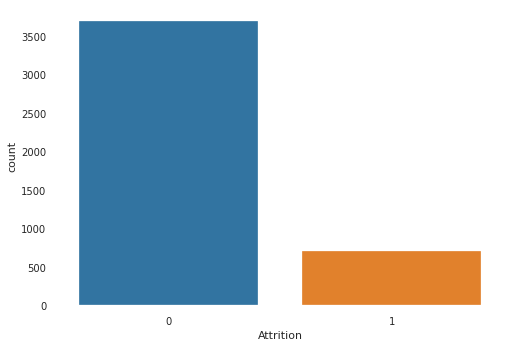

In [10]:
sns.countplot(x='Attrition', data=df)

In [5]:
#missing data => Find total rows having missing values and calculate the percentage of missing values for each field.
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
NumCompaniesWorked,19,0.004308
TotalWorkingYears,9,0.002041
YearsWithCurrManager,0,0.000000
JobLevel,0,0.000000
Attrition,0,0.000000
BusinessTravel,0,0.000000
Department,0,0.000000
DistanceFromHome,0,0.000000
Education,0,0.000000
EducationField,0,0.000000


In [6]:
#Let us drop the na values as they are minimal here 
df.dropna(inplace=True)

In [7]:
#missing data => Find total rows having missing values and calculate the percentage of missing values for each field.
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
YearsWithCurrManager,0,0.0
YearsSinceLastPromotion,0,0.0
Attrition,0,0.0
BusinessTravel,0,0.0
Department,0,0.0
DistanceFromHome,0,0.0
Education,0,0.0
EducationField,0,0.0
Gender,0,0.0
JobLevel,0,0.0


In [8]:
vars_num = list(df.select_dtypes([np.number]).columns) # List of Numerical Columns

In [9]:
vars_num

['Age',
 'Attrition',
 'DistanceFromHome',
 'MonthlyIncome',
 'NumCompaniesWorked',
 'PercentSalaryHike',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'YearsAtCompany',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

### Univariate Analysis

<Figure size 576x396 with 0 Axes>

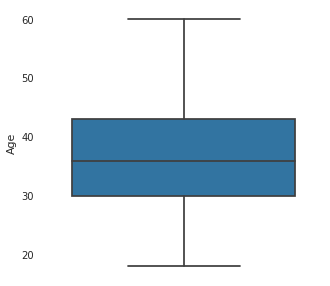

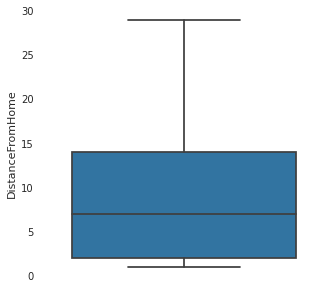

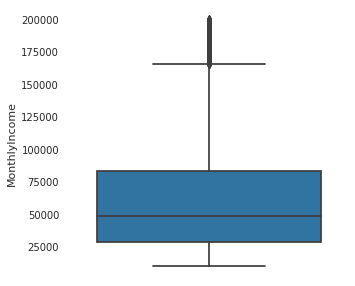

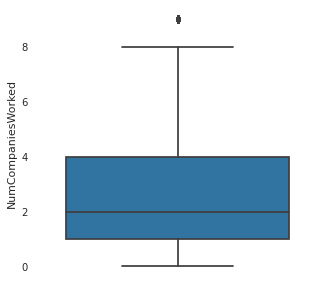

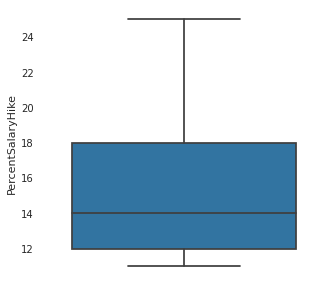

...

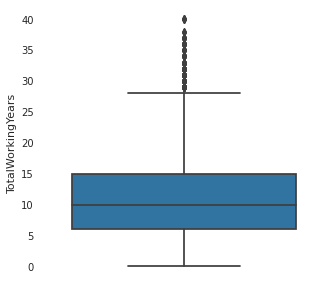

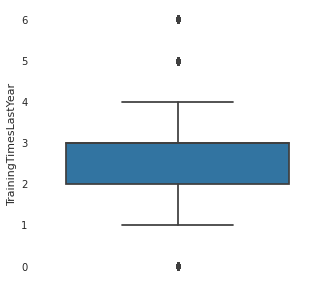

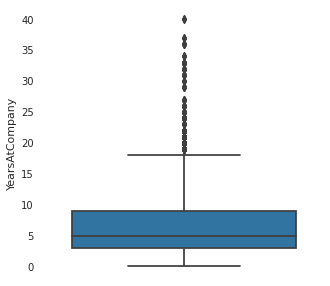

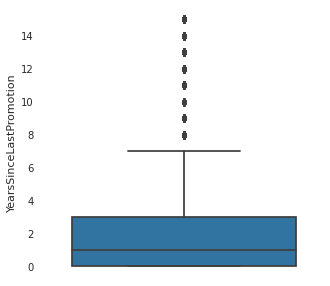

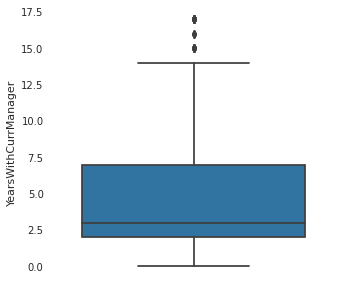

In [16]:
fig = plt.figure()

for var in vars_num:
    if (var != 'Attrition'):
        fig = plt.figure(figsize =(5, 5))
        sns.boxplot(y=df[var],orient="v")
        

**From The Box Plots We can say that:**

1. Age variable does not have any outlier and is normally distributed
2. Distance From HOme is also normally distributed and has no outliers 
3. Monthly Income has many outliers and is Right Skewed
4. No of Companies has very minimal outlier
5. We don't see any pattern with StockOptionLevel
6. Total Working Years is Right Skewed and has many outliers
7. Training Time Last year has few outliers
8. Years At Company is Right Skewed and has many outliers
9. Years With Last Promotion too has few outliers and is right skewed
10. Years with current manager has little outliers and is somewhat Right Skewed

array([[<AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Attrition'}>,
        <AxesSubplot:title={'center':'DistanceFromHome'}>],
       [<AxesSubplot:title={'center':'MonthlyIncome'}>,
        <AxesSubplot:title={'center':'NumCompaniesWorked'}>,
        <AxesSubplot:title={'center':'PercentSalaryHike'}>],
       [<AxesSubplot:title={'center':'StockOptionLevel'}>,
        <AxesSubplot:title={'center':'TotalWorkingYears'}>,
        <AxesSubplot:title={'center':'TrainingTimesLastYear'}>],
       [<AxesSubplot:title={'center':'YearsAtCompany'}>,
        <AxesSubplot:title={'center':'YearsSinceLastPromotion'}>,
        <AxesSubplot:title={'center':'YearsWithCurrManager'}>]],
      dtype=object)

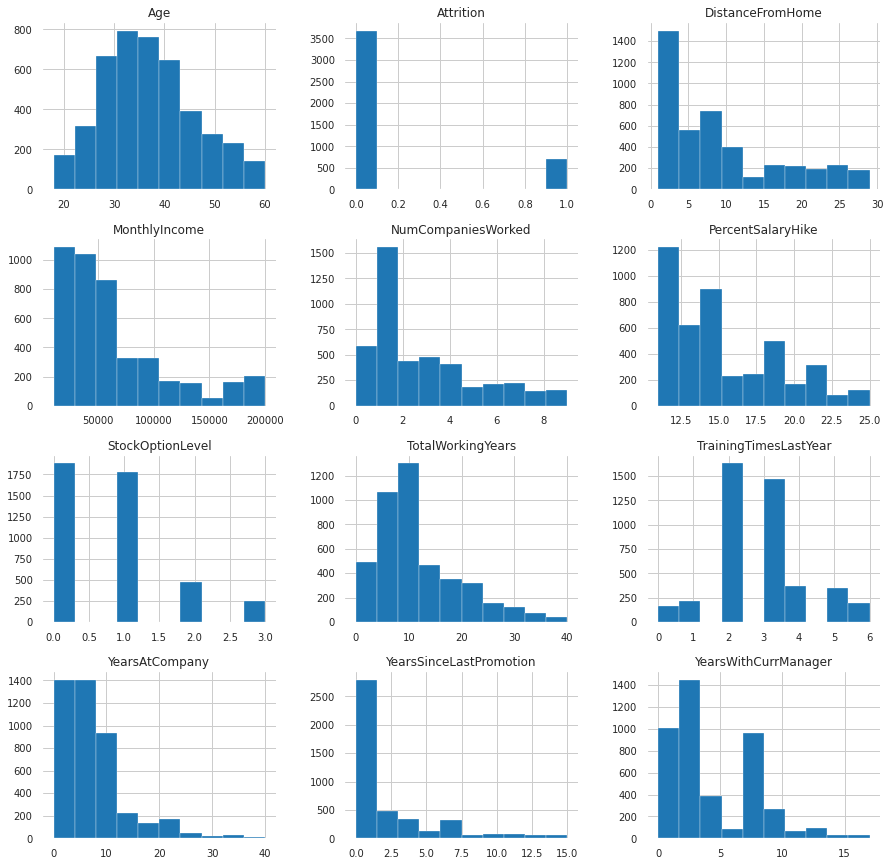

In [18]:
df.hist(figsize=(15,15))

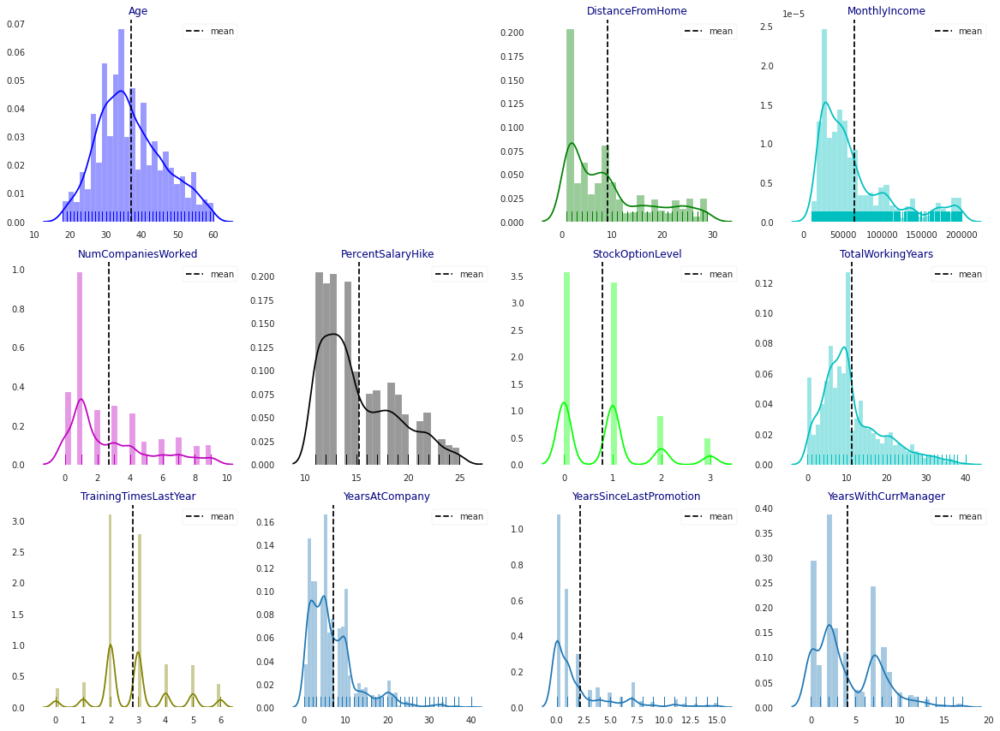

In [19]:
cols = vars_num
length = len(cols)
cs = ["b","r","g","c","m","k","lime","c","olive"]
fig = plt.figure(figsize=(20,20))

for i,j,k in itertools.zip_longest(cols,range(length),cs):
    if (i != 'Attrition'):
        plt.subplot(4,4,j+1)
        ax = sns.distplot(df[i],color=k,rug=True)
        ax.set_facecolor("w")
        plt.axvline(df[i].mean(),linestyle="dashed",label="mean",color="k")
        plt.legend(loc="best")
        plt.title(i,color="navy")
        plt.xlabel("")

### Bivariate Analysis

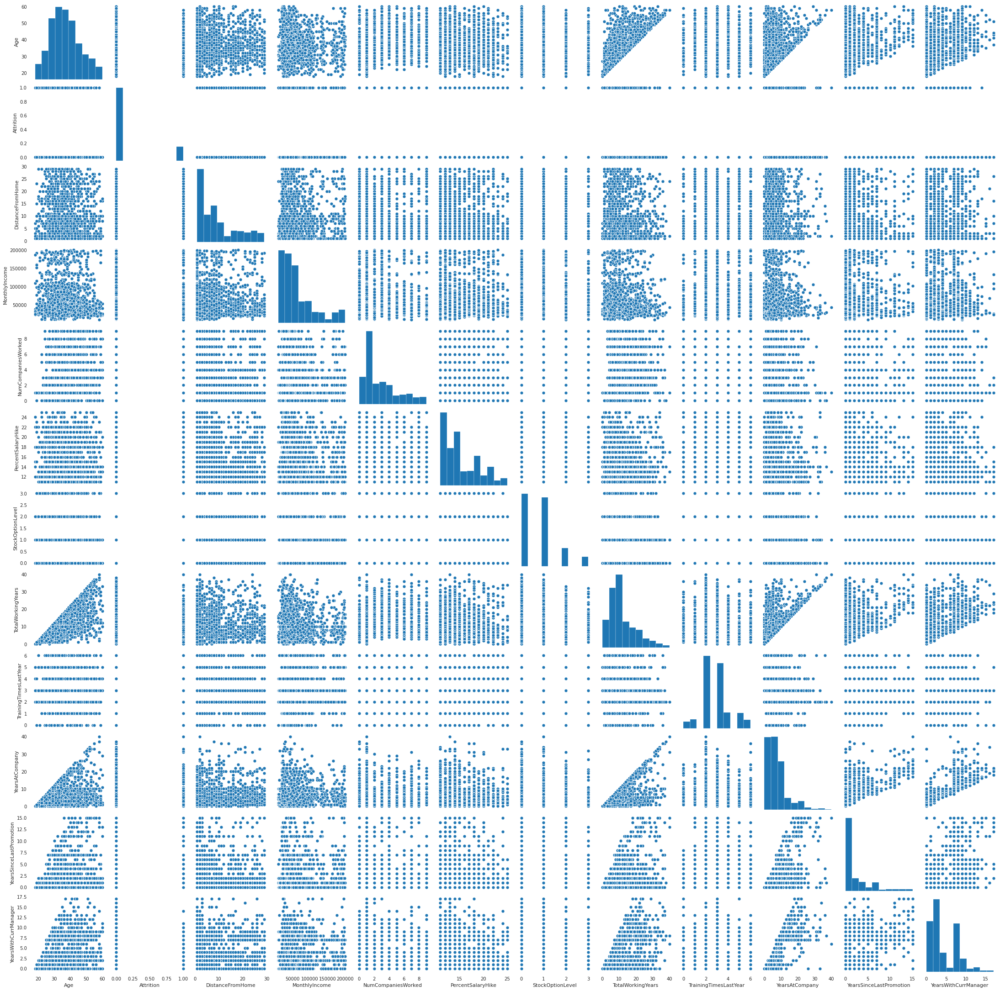

In [20]:
# Let us do a bivariate analysis with pair plot

sns.pairplot(df[vars_num],diag_kind='auto')

In [21]:
corr_mat = df[vars_num].corr()
corr_mat

,Age,Attrition,DistanceFromHome,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.158399,0.007376,-0.045163,0.299527,-0.032561,-0.031504,0.680037,-0.028962,0.311281,0.215650,0.201580
Attrition,-0.158399,1.000000,-0.009449,-0.030160,0.042831,0.033153,-0.008164,-0.169670,-0.047586,-0.133003,-0.031423,-0.154692
DistanceFromHome,0.007376,-0.009449,1.000000,-0.022757,-0.014449,0.037720,0.009353,0.009574,-0.008957,0.030746,0.002243,0.021773
MonthlyIncome,-0.045163,-0.030160,-0.022757,1.000000,-0.021446,0.004607,0.027242,-0.034398,0.049780,0.000088,0.064470,0.023095
NumCompaniesWorked,0.299527,0.042831,-0.014449,-0.021446,1.000000,0.030064,0.016291,0.238807,-0.031335,-0.117213,-0.035855,-0.109372
PercentSalaryHike,-0.032561,0.033153,0.037720,0.004607,0.030064,1.000000,0.012104,-0.018480,-0.036720,-0.029022,-0.028654,-0.039687
StockOptionLevel,-0.031504,-0.008164,0.009353,0.027242,0.016291,0.012104,1.000000,0.003138,-0.068028,0.009369,0.019889,0.019398
TotalWorkingYears,0.680037,-0.169670,0.009574,-0.034398,0.238807,-0.018480,0.003138,1.000000,-0.041459,0.627738,0.404058,0.458640
TrainingTimesLastYear,-0.028962,-0.047586,-0.008957,0.049780,-0.031335,-0.036720,-0.068028,-0.041459,1.000000,-0.010447,0.015340,-0.015792
YearsAtCompany,0.311281,-0.133003,0.030746,0.000088,-0.117213,-0.029022,0.009369,0.627738,-0.010447,1.000000,0.618722,0.769161


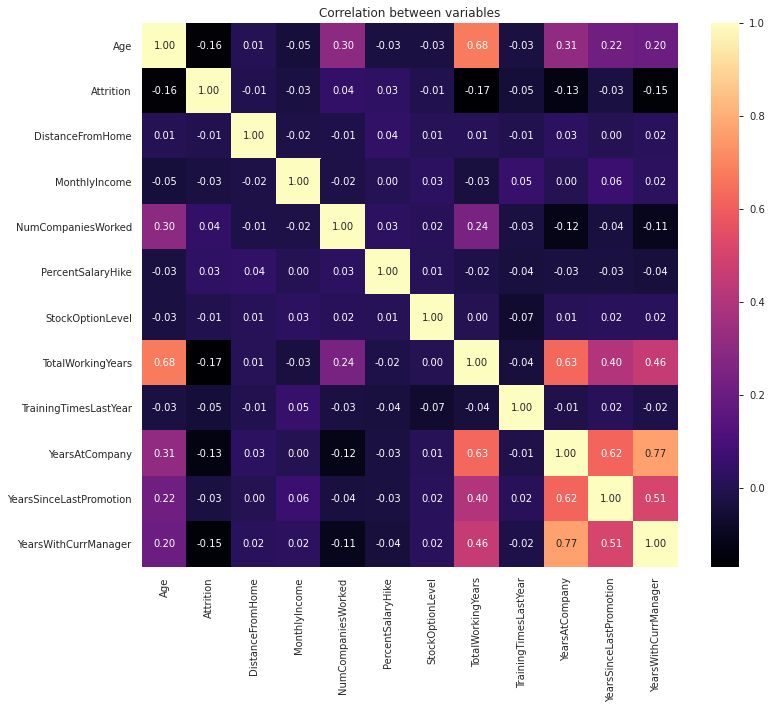

In [22]:
plt.figure(figsize=(12,10))
with sns.axes_style("darkgrid"):
    sns.heatmap(corr_mat,cmap='magma', annot=True,fmt='.2f') 
plt.title("Correlation between variables")
plt.show()

**Finding Correlation of Different Variable with Our target Variable i.e Attrition**

**Attrition With Age**

Null Hypothesis H0 -> There is no significant difference in people's Age with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's Age with the people either with Attrition Yes or Attrition as No

In [23]:
LinregressResult = linregress(df[df['Attrition'] == 1]['Age'].sample(n=700),df[df['Attrition'] == 0]['Age'].sample(n=700))
print(LinregressResult)

LinregressResult(slope=0.0025889596283049923, intercept=37.492966574323894, rvalue=0.0027622459374102475, pvalue=0.9418445639462756, stderr=0.035475911803749496)


In [24]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['Age'].sample(n=700),
                                       df[df['Attrition'] == 0]['Age'].sample(n=700)) 
#define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

Pearson Correlation Coefficient:  -0.06314224363339324 and a P-value of: 0.09506446721014278


In [25]:
if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With Distance From Home**

Null Hypothesis H0 -> There is no significant difference in people's Distance from their Home with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's Distance from their Home with the people either with Attrition Yes or Attrition as No

In [27]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['DistanceFromHome'].sample(n=700)
                                       ,df[df['Attrition'] == 0]['DistanceFromHome'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  -0.02465712195331945 and a P-value of: 0.5148533310947631
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With MonthlyIncome**

Null Hypothesis H0 -> There is no significant difference in people's MonthlyIncome with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's MonthlyIncome with the people either with Attrition Yes or Attrition as No


In [28]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['MonthlyIncome'].sample(n=700),
                                       df[df['Attrition'] == 0]['MonthlyIncome'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  -0.0016529641847971878 and a P-value of: 0.965179256781982
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With PercentSalaryHike**

Null Hypothesis H0 -> There is no significant difference in people's PercentSalaryHike with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's PercentSalaryHike with the people either with Attrition Yes or Attrition as No


In [29]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['PercentSalaryHike'].sample(n=700),
                                       df[df['Attrition'] == 0]['PercentSalaryHike'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  0.005485168887761349 and a P-value of: 0.8848169440763972
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With YearsAtCompany**

Null Hypothesis H0 -> There is no significant difference in people's YearsAtCompany with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's YearsAtCompany with the people either with Attrition Yes or Attrition as No


In [30]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['YearsAtCompany'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsAtCompany'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  -0.020117472829991316 and a P-value of: 0.5951687575663565
We reject our Null hypothesis and proceed with our Alternate hypothesis


**Attrition With YearsSinceLastPromotion**

Null Hypothesis H0 -> There is no significant difference in people's YearsSinceLastPromotion with the people either with Attrition Yes or Attrition as No

Alternate hypothesis Ha -> There is significant difference in people's YearsSinceLastPromotion with the people either with Attrition Yes or Attrition as No


In [31]:
pearson_coef, p_value = stats.pearsonr(df[df['Attrition'] == 1]['YearsSinceLastPromotion'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsSinceLastPromotion'].sample(n=700)) #define the columns to perform calculations on
print("Pearson Correlation Coefficient: ", pearson_coef, "and a P-value of:", p_value) # Results 

if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

Pearson Correlation Coefficient:  0.03350882810907249 and a P-value of: 0.3760356061359966
We reject our Null hypothesis and proceed with our Alternate hypothesis


In [32]:
if (p_value > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

We reject our Null hypothesis and proceed with our Alternate hypothesis


In [33]:
df[df.columns[0:]].corr()['Attrition'][:]

Age                       -0.158399
Attrition                  1.000000
DistanceFromHome          -0.009449
MonthlyIncome             -0.030160
NumCompaniesWorked         0.042831
PercentSalaryHike          0.033153
StockOptionLevel          -0.008164
TotalWorkingYears         -0.169670
TrainingTimesLastYear     -0.047586
YearsAtCompany            -0.133003
YearsSinceLastPromotion   -0.031423
YearsWithCurrManager      -0.154692
Name: Attrition, dtype: float64

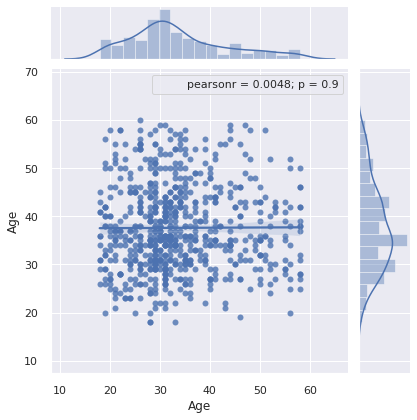

In [34]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['Age'].sample(n=700),
                                       df[df['Attrition'] == 0]['Age'].sample(n=700),
              data=df,kind="reg",color='b').annotate(stats.pearsonr)
plt.show()

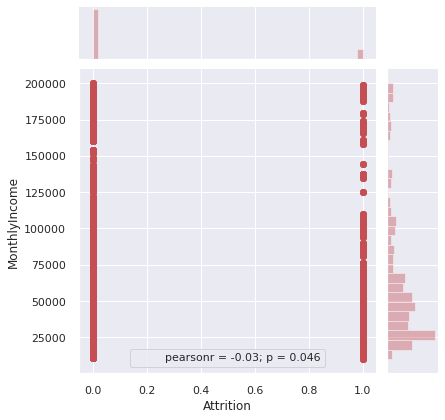

In [35]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot('Attrition','MonthlyIncome',data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

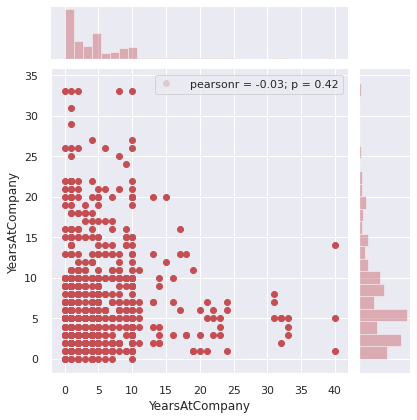

In [36]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['YearsAtCompany'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsAtCompany'].sample(n=700),data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

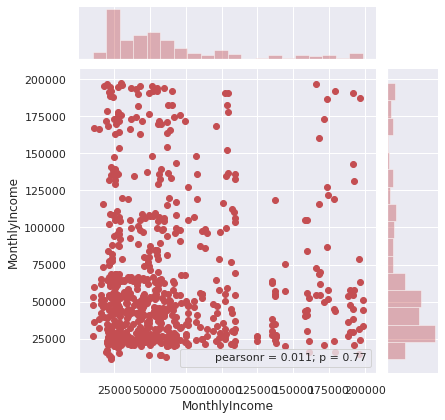

In [37]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['MonthlyIncome'].sample(n=700),
                                       df[df['Attrition'] == 0]['MonthlyIncome'].sample(n=700)
              ,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

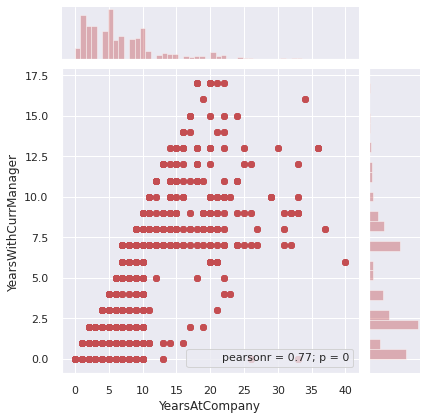

In [39]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot('YearsAtCompany','YearsWithCurrManager',data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

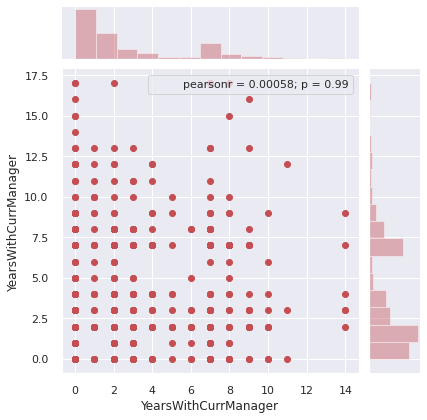

In [40]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['YearsWithCurrManager'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsWithCurrManager'].sample(n=700),data=df,kind="scatter",color='r').annotate(stats.pearsonr)
plt.show()

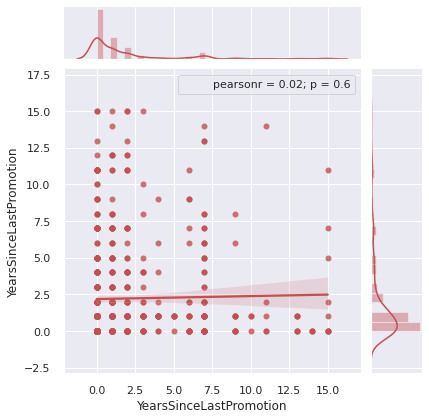

In [42]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(df[df['Attrition'] == 1]['YearsSinceLastPromotion'].sample(n=700),
                                       df[df['Attrition'] == 0]['YearsSinceLastPromotion'].sample(n=700),
              data=df,kind="reg",color='r').annotate(stats.pearsonr)
plt.show()

**So from above all visualizations and calculations we can draw some insights about correlation:**

    • There are almost weak correlation for all the independent variables with our dependent variable i.e Attrition variable
    • Though the correlation is less but we have p-values which are greater than 0.05 so the variables like Age,DistanceFromHome,MonthlyIncome,YearsAtCompany,YearsSinceLastPromotion all have a significant relation with the dependent variable i.e Attrition 
    • There is a little stronger correlation between YearsAtCompany and YearsWithCurrentManager.


In [20]:
def plot_relative_distribution(df, feature, hue, title='', size=2):
    f, ax = plt.subplots(1,1, figsize=(4*size,3*size))
    total = float(len(df))
    sns.countplot(x=feature, hue=hue, data=df, palette='Set2',orient='v')
    plt.title(title)
    plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='large')
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center",rotation='horizontal') 
    plt.show()

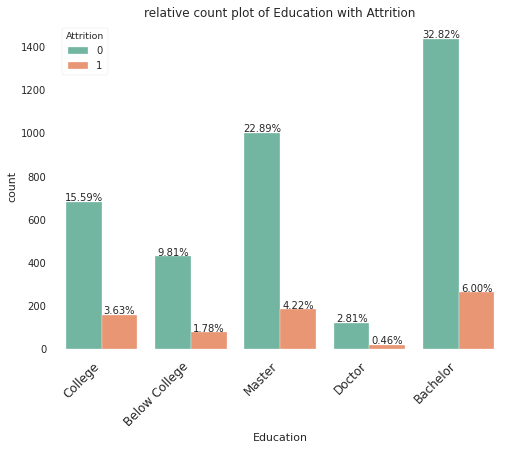

In [21]:
plot_relative_distribution(df=df, feature='Education', hue='Attrition', 
                           title = 'relative count plot of Education with Attrition', size=2)

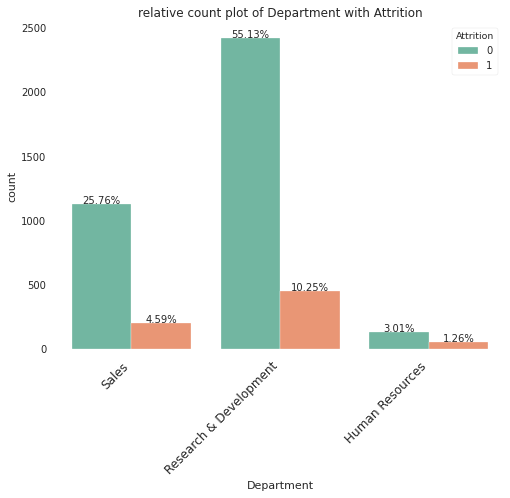

In [22]:
plot_relative_distribution(df=df, feature='Department', hue='Attrition', 
                           title = 'relative count plot of Department with Attrition', size=2)

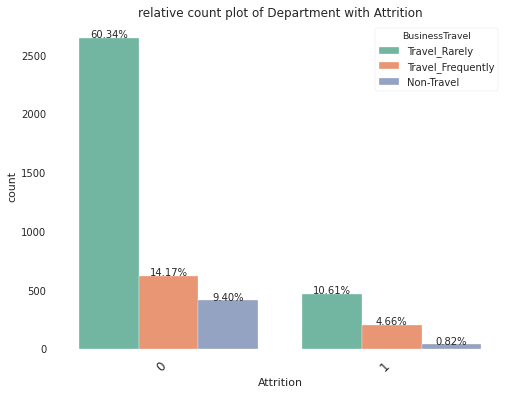

In [26]:
plot_relative_distribution(df=df, feature='Attrition', hue='BusinessTravel', 
                           title = 'relative count plot of Department with Attrition', size=2)

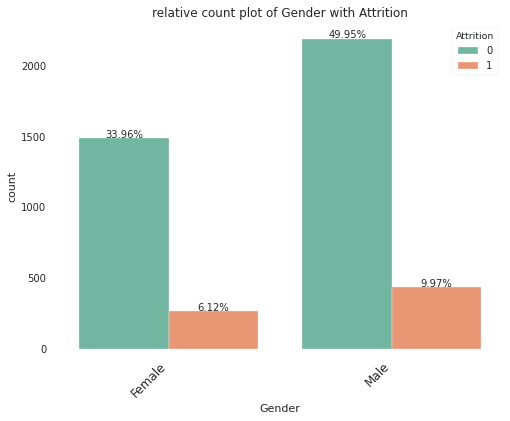

In [23]:
plot_relative_distribution(df=df, feature='Gender', hue='Attrition', 
                           title = 'relative count plot of Gender with Attrition', size=2)

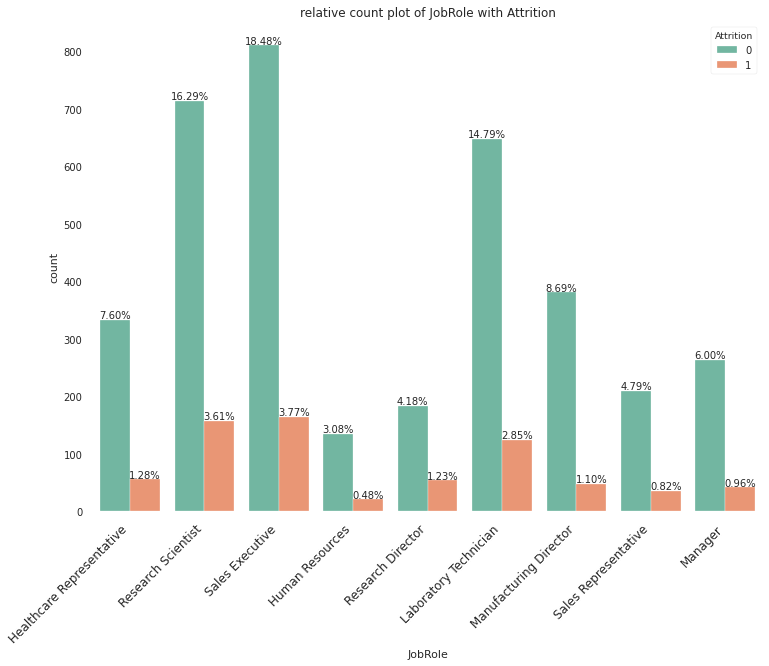

In [24]:
plot_relative_distribution(df=df, feature='JobRole', hue='Attrition', 
                           title = 'relative count plot of JobRole with Attrition', size=3)

From the above visualizations we can infer out how the Attrition is spreaded over other categorical variables like:
1. People With bachelor's degree and master's degree tend to have more Attrition(i.e leaving the company in search of new jobs)
2. Research & Development department has a significantly more attrition rate compared to other departments
3. People who travel rarely are leaving the company more i.e attrtion rate is comparatively high for them
4. Male Attrition rate is higher compared to female
5. People with Job Role Research Scientist  and Sales Executive have more attrition rate

#### Let Us Perform few Statistical Tests on Our Target Variable with other Variables:

We Are going to Perform belwo tests:
1. Mann-Whitney Test
2. Chi Square Test
3. Two-Sample Independent T Test
4. Anova

In [43]:
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,0,Travel_Rarely,Sales,6,College,Life Sciences,Female,Low,Healthcare Representative,Married,131160,1.0,11,0,1.0,6,1,0,0
1,31,1,Travel_Frequently,Research & Development,10,Below College,Life Sciences,Female,Low,Research Scientist,Single,41890,0.0,23,1,6.0,3,5,1,4
2,32,0,Travel_Frequently,Research & Development,17,Master,Other,Male,Very High,Sales Executive,Married,193280,1.0,15,3,5.0,2,5,0,3
3,38,0,Non-Travel,Research & Development,2,Doctor,Life Sciences,Male,High,Human Resources,Married,83210,3.0,11,3,13.0,5,8,7,5
4,32,0,Travel_Rarely,Research & Development,10,Below College,Medical,Male,Low,Sales Executive,Single,23420,4.0,12,2,9.0,2,6,0,4


### Mann-Whitney Test

##### Attrition and NumCompaniesWorked

In [66]:
# Ho -> There is no significant difference bewteen No Of Companies Worked for Attrition Yes and No
# Ha -> There is significant difference in No Of Companies Worked for Attrition Yes and No

stats , p = mannwhitneyu(df[df['Attrition'] == 1]['NumCompaniesWorked'].sample(n=700),
                                       df[df['Attrition'] == 0]['NumCompaniesWorked'].sample(n=700))

print(stats," ",p)
if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

227911.5   0.009798194528384688
We accept our Null Hypothesis


##### Attrition and PercentSalaryHike

In [54]:
# Ho -> There is no significant difference bewteen PercentSalaryHike for Attrition Yes and No
# Ha -> There is significant difference in PercentSalaryHike for Attrition Yes and No

stats , p = mannwhitneyu(df[df['Attrition'] == 1]['PercentSalaryHike'].sample(n=702),
                                       df[df['Attrition'] == 0]['PercentSalaryHike'].sample(n=702))

print(stats," ",p)
if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

237636.5   0.12296210466508412
We reject our Null hypothesis and proceed with our Alternate hypothesis


##### Attrition and DistanceFromHome

In [65]:
# Ho -> There is no significant difference bewteen PercentSalaryHike for Attrition Yes and No
# Ha -> There is significant difference in PercentSalaryHike for Attrition Yes and No

stats , p = mannwhitneyu(df[df['Attrition'] == 1]['DistanceFromHome'].sample(n=700),
                                       df[df['Attrition'] == 0]['DistanceFromHome'].sample(n=700))

print(stats," ",p)
if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

243918.0   0.44294116254583216
We reject our Null hypothesis and proceed with our Alternate hypothesis


##### Attrition and MonthlyIncome

In [73]:
# Ho -> There is no significant difference bewteen MonthlyIncome for Attrition Yes and No
# Ha -> There is significant difference in MonthlyIncome for Attrition Yes and No

stats , p = mannwhitneyu(df[df['Attrition'] == 1]['MonthlyIncome'].sample(n=700),
                                       df[df['Attrition'] == 0]['MonthlyIncome'].sample(n=700))

print(stats," ",p)
if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

236226.5   0.12304380974099116
We reject our Null hypothesis and proceed with our Alternate hypothesis


In [74]:
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,0,Travel_Rarely,Sales,6,College,Life Sciences,Female,Low,Healthcare Representative,Married,131160,1.0,11,0,1.0,6,1,0,0
1,31,1,Travel_Frequently,Research & Development,10,Below College,Life Sciences,Female,Low,Research Scientist,Single,41890,0.0,23,1,6.0,3,5,1,4
2,32,0,Travel_Frequently,Research & Development,17,Master,Other,Male,Very High,Sales Executive,Married,193280,1.0,15,3,5.0,2,5,0,3
3,38,0,Non-Travel,Research & Development,2,Doctor,Life Sciences,Male,High,Human Resources,Married,83210,3.0,11,3,13.0,5,8,7,5
4,32,0,Travel_Rarely,Research & Development,10,Below College,Medical,Male,Low,Sales Executive,Single,23420,4.0,12,2,9.0,2,6,0,4


### Chi Square Test

##### Gender and Department

In [75]:
chitable = pd.crosstab(df.Gender, df.Department)
chitable

Department,Human Resources,Research & Development,Sales
Gender,,,
Female,71,1159,526
Male,116,1706,804


In [79]:
# Ho -> There is no dependency between Gender and Department

# Ha -> There is dependency between Gender and Department

stats, p, dof, expected = chi2_contingency(chitable)
print (stats," ", p)

if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

0.6701681232500649   0.7152779563979197
We reject our Null hypothesis and proceed with our Alternate hypothesis


##### BusinessTravel and Department

In [81]:
chitable = pd.crosstab(df.BusinessTravel, df.Department)
chitable

Department,Human Resources,Research & Development,Sales
BusinessTravel,,,
Non-Travel,9,329,110
Travel_Frequently,24,516,285
Travel_Rarely,154,2020,935


In [88]:
# Ho -> There is no dependency between BusinessTravel and Department

# Ha -> There is dependency between BusinessTravel and Department

stats, p, dof, expected = chi2_contingency(chitable)
print (stats," ", p)

if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

46.33088339387883   8.652925805866708e-05
We accept our Null Hypothesis


##### JobLevel and Education

In [84]:
chitable = pd.crosstab(df.JobLevel, df.Education)
chitable

Education,Bachelor,Below College,College,Doctor,Master
JobLevel,,,,,
Exemplary,89,18,42,6,49
High,268,74,111,24,174
Low,568,230,336,50,435
Medium,665,165,284,54,422
Very High,111,21,69,9,108


In [87]:
# Ho -> There is no dependency between JobLevel and Education

# Ha -> There is dependency between JobLevel and Education

stats, p, dof, expected = chi2_contingency(chitable)
print (stats," ", p)

if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

46.33088339387883   8.652925805866708e-05
We accept our Null Hypothesis


In [89]:
df.head()

,Age,Attrition,BusinessTravel,Department,DistanceFromHome,Education,EducationField,Gender,JobLevel,JobRole,MaritalStatus,MonthlyIncome,NumCompaniesWorked,PercentSalaryHike,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsSinceLastPromotion,YearsWithCurrManager
0,51,0,Travel_Rarely,Sales,6,College,Life Sciences,Female,Low,Healthcare Representative,Married,131160,1.0,11,0,1.0,6,1,0,0
1,31,1,Travel_Frequently,Research & Development,10,Below College,Life Sciences,Female,Low,Research Scientist,Single,41890,0.0,23,1,6.0,3,5,1,4
2,32,0,Travel_Frequently,Research & Development,17,Master,Other,Male,Very High,Sales Executive,Married,193280,1.0,15,3,5.0,2,5,0,3
3,38,0,Non-Travel,Research & Development,2,Doctor,Life Sciences,Male,High,Human Resources,Married,83210,3.0,11,3,13.0,5,8,7,5
4,32,0,Travel_Rarely,Research & Development,10,Below College,Medical,Male,Low,Sales Executive,Single,23420,4.0,12,2,9.0,2,6,0,4


### Two-Sample Independent T Test

##### Attrition and Monthly income

In [109]:
# Ho -> There is no significant difference in the mean of MonthlyIncome between Attrition Yes and Attrition No

# Ha -> There is a significant difference in the mean of MonthlyIncome between Attrition Yes and Attrition No

stats, p = ttest_ind(df[df['Attrition'] == 1]['MonthlyIncome'].sample(n=700),
                                       df[df['Attrition'] == 0]['MonthlyIncome'].sample(n=700))
print (stats, p)

if (p > 0.05):
    print ("We reject our Null hypothesis and proceed with our Alternate hypothesis")
else:
    print ("We accept our Null Hypothesis")

-1.3594742621817981 0.17421558618773653
We reject our Null hypothesis and proceed with our Alternate hypothesis


### Anova (One Way and Two Way)

#### One Way Anova


In [110]:
model=ols('Attrition~C(Age)',df).fit()

In [113]:
oneway=sm.stats.anova_lm(model,typ=2)
print (oneway)

              sum_sq      df         F        PR(>F)
C(Age)     47.561123    42.0  9.031957  3.685910e-53
Residual  544.014641  4339.0       NaN           NaN


In [13]:
def anovatable(oneway):
    oneway["eta_sq"]=oneway[:-1]["sum_sq"]/sum(oneway["sum_sq"])
    cols=["sum_sq","df","F","PR(>F)","eta_sq"]
    oneway=oneway[cols]
    return oneway

In [116]:
anovatable(oneway)

,sum_sq,df,F,PR(>F),eta_sq
C(Age),47.561123,42.0,9.031957,3.685910e-53,0.080397
Residual,544.014641,4339.0,NaN,NaN,NaN


Thus we can say that Age is only affecting Attrition by a small amount of 8%

In [118]:
model=ols('Attrition~C(MonthlyIncome)',df).fit()

In [119]:
oneway=sm.stats.anova_lm(model,typ=2)
print (oneway)

                      sum_sq      df          F  PR(>F)
C(MonthlyIncome)  540.925764  1348.0  24.029279     0.0
Residual           50.650000  3033.0        NaN     NaN


In [120]:
anovatable(oneway)

,sum_sq,df,F,PR(>F),eta_sq
C(MonthlyIncome),540.925764,1348.0,24.029279,0.0,0.914381
Residual,50.650000,3033.0,NaN,NaN,NaN


Monthly Income has a greater Impact on Attrition of Employees and affecting by 91%

In [121]:
model=ols('Attrition~C(YearsAtCompany)',df).fit()

In [123]:
oneway=sm.stats.anova_lm(model,typ=2)
print (oneway)

                       sum_sq      df         F        PR(>F)
C(YearsAtCompany)   38.366092    36.0  8.370378  6.276547e-42
Residual           553.209672  4345.0       NaN           NaN


In [124]:
anovatable(oneway)

,sum_sq,df,F,PR(>F),eta_sq
C(YearsAtCompany),38.366092,36.0,8.370378,6.276547e-42,0.064854
Residual,553.209672,4345.0,NaN,NaN,NaN


Thus we can say that YearsAtCompany is only affecting Attrition by a small amount of 6%


#### Two Way Anova

In [10]:
model=ols('Attrition~C(MonthlyIncome)+C(YearsAtCompany)',df).fit()

In [11]:
twoway=sm.stats.anova_lm(model,typ=2)
print (twoway)

                       sum_sq      df          F         PR(>F)
C(MonthlyIncome)   522.653341  1348.0  30.365728   0.000000e+00
C(YearsAtCompany)   18.117535    36.0  39.414541  5.274793e-222
Residual            38.394902  3007.0        NaN            NaN


In [14]:
anovatable(twoway)

,sum_sq,df,F,PR(>F),eta_sq
C(MonthlyIncome),522.653341,1348.0,30.365728,0.000000e+00,0.902424
C(YearsAtCompany),18.117535,36.0,39.414541,5.274793e-222,0.031282
Residual,38.394902,3007.0,NaN,NaN,NaN


In [17]:
twoway = ols(formula= 'Attrition ~ Age+MonthlyIncome', data = df).fit()
twoway.params

Intercept        4.176292e-01
Age             -6.438119e-03
MonthlyIncome   -2.914519e-07
dtype: float64

In [18]:
print(twoway.summary())

                            OLS Regression Results                            
Dep. Variable:              Attrition   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.026
Method:                 Least Squares   F-statistic:                     59.57
Date:                Sat, 25 Jul 2020   Prob (F-statistic):           2.99e-26
Time:                        11:26:30   Log-Likelihood:                -1771.6
No. Observations:                4382   AIC:                             3549.
Df Residuals:                    4379   BIC:                             3568.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept         0.4176      0.024     17.136

In [19]:
twoway.conf_int(alpha=0.05)

,0,1
Intercept,3.698501e-01,4.654082e-01
Age,-7.614904e-03,-5.261333e-03
MonthlyIncome,-5.195402e-07,-6.336359e-08


The P>|t| value being zero indicates that we can reject the Null Hypothesis and accept the Alternate Hypothesis that the variables have significant effect on the Attrition of Employee

The R squared value being low indicates there is weak collienearity betwwen Attrition Monthly Income and Age